In [1]:
import numpy as np
import h5py
%matplotlib inline
from IPython.display import Image
import pandas as pd

%load_ext autoreload
%autoreload 2

import matplotlib
from matplotlib import pyplot as plt
from matplotlib import pylab
%config InlineBackend.figure_format = 'retina'
matplotlib.rcParams['figure.dpi'] = 80
params = {'legend.fontsize': 'large',
          'figure.figsize': (8, 8),
         'axes.labelsize': 'x-large',
         'axes.titlesize': 'x-large',
         'xtick.labelsize': 'large',
         'ytick.labelsize': 'large'}
pylab.rcParams.update(params)

from astropy.io import fits
from astropy.visualization import make_lupton_rgb

In [2]:
#tag = 'gri_cosmos'
tag = 'gri'
base_dir = '/scratch/ksf293/kavli/anomaly'
imarr_fn = f'{base_dir}/data/images_h5/images_{tag}.h5'
results_fn = f'{base_dir}/results/results_{tag}.h5'
imdict_fn = f'{base_dir}/data/idxdicts_h5/idx2imloc_{tag}.npy'
resdict_fn = f'{base_dir}/data/idxdicts_h5/idx2resloc_{tag}.npy'

In [3]:
plot_dir = '../papers/paper_main/images'

In [4]:
imarr = h5py.File(imarr_fn, 'r')
res = h5py.File(results_fn, 'r')
print(imarr.keys())
print(res.keys())
print(len(imarr['idxs']))

<KeysViewHDF5 ['idxs', 'images', 'object_ids']>
<KeysViewHDF5 ['anomaly_scores', 'disc_scores', 'gen_scores', 'idxs', 'object_ids', 'reconstructed']>
942782


In [5]:
idx2imloc = np.load(imdict_fn, allow_pickle=True).item()
idx2resloc = np.load(resdict_fn, allow_pickle=True).item()

In [6]:
def luptonize(x, rgb_q=15, rgb_stretch=0.5, rgb_min=0):
    if x.ndim==3:
        x = make_lupton_rgb(x[:,:,2], x[:,:,1], x[:,:,0],
                      Q=rgb_q, stretch=rgb_stretch, minimum=rgb_min)
    elif x.ndim==4:
        x = np.array([make_lupton_rgb(xi[:,:,2], xi[:,:,1], xi[:,:,0],
                      Q=rgb_q, stretch=rgb_stretch, minimum=rgb_min)
                      for xi in x])
    else:
        raise ValueError(f"Wrong number of dimensions! Gave {x.ndim}, need 3 or 4")
    return x

In [7]:
def plot_ims(ids, nrows, ncols, saveto=None):
    assert len(ids)<=nrows*ncols, "bad rows/cols for number of ids!"
    
    subsize = 2
    fig, axarr = plt.subplots(nrows,ncols,figsize=(ncols*subsize,nrows*subsize))
    plt.subplots_adjust(hspace=0.2, wspace=0.05)

    count = 0
    for i in range(nrows):
        for j in range(ncols):
            idx = ids[count]
            loc = idx2imloc[idx]
            im = imarr['images'][loc]
            obj_id = int(imarr['object_ids'][loc])
            if nrows==1 and ncols==1:
                ax = axarr
            elif nrows==1:
                ax = axarr[j]
            elif ncols==1:
                ax = axarr[i]
            else:
                ax = axarr[i][j]
            title = f"ID: {obj_id}"
            ax.set_title(title, fontsize=8)
            ax.imshow(luptonize(im))
            ax.set_xticks([])
            ax.set_yticks([])
            
            count += 1
            if count>=len(ids):
                break
                
        if count>=len(ids):
            break
                
    if saveto:
        plt.savefig(saveto, bbox_inches='tight')#, pad_inches=0)

In [9]:
#(935055, 936569) are COSMOS field, not necessarily 3sig 
bluecore_ids = [936569, 941128, 782291, 896225,404105,549909] #935055
sf_ids = [461525, 461522, 702705, 707620, 402208, 86279]
tidal_ids = [406992,105162,232476,402855,112806,402153] # 936581 in COSMOS
purple_ids = [631495, 60339,293191, 105685, 80217, 539520]
unknown_ids = [404340, 402594,732306] #66001

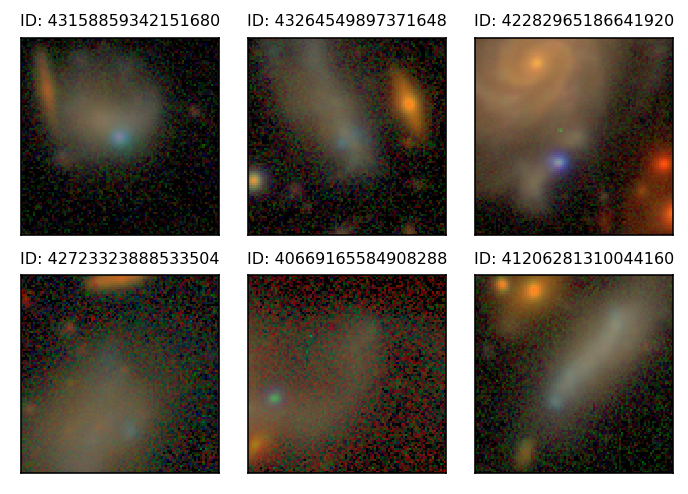

In [9]:
plot_ims(bluecore_ids, 2, 3, saveto=f'{plot_dir}/anomalies_bluecore.png')

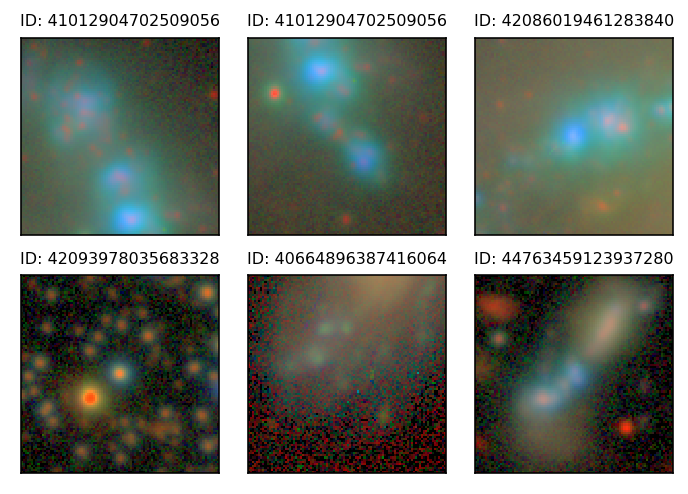

In [40]:
plot_ims(sf_ids, 2, 3, saveto=f'{plot_dir}/anomalies_starforming.png')

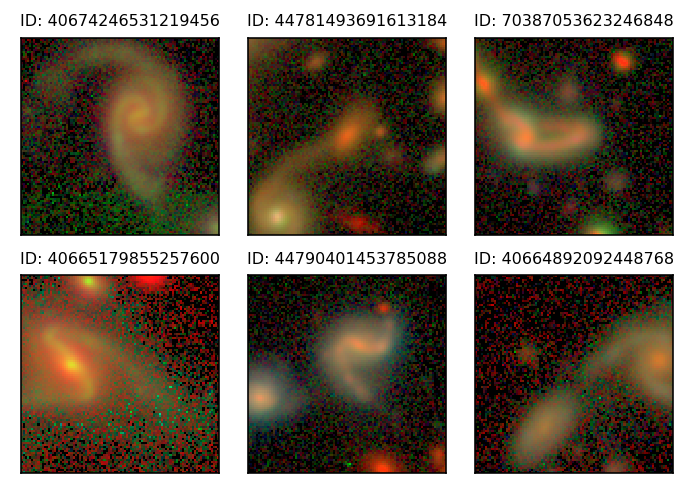

In [43]:
plot_ims(tidal_ids, 2, 3, saveto=f'{plot_dir}/anomalies_tidalfeatures.png')

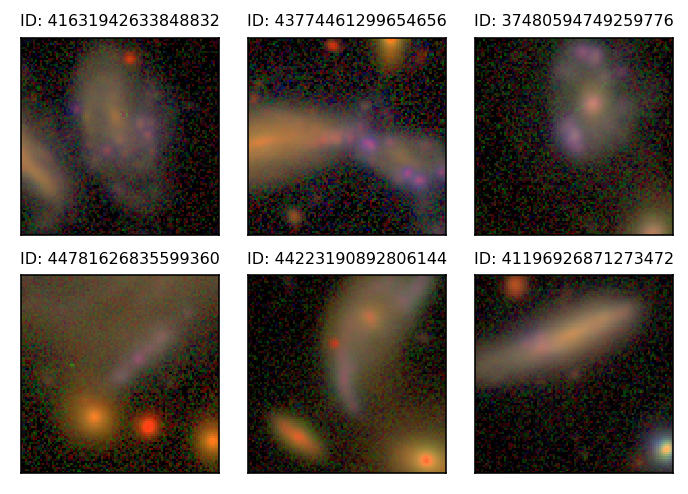

In [44]:
plot_ims(purple_ids, 2, 3, saveto=f'{plot_dir}/anomalies_purple.png')

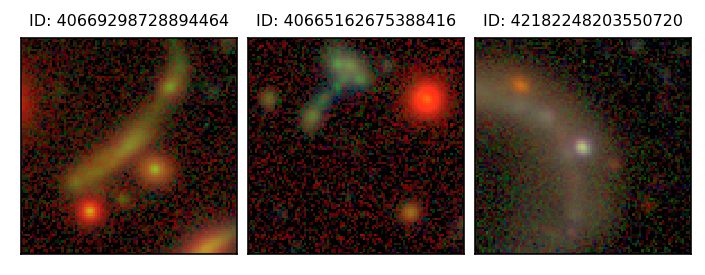

In [49]:
plot_ims(unknown_ids, 1, 3, saveto=f'{plot_dir}/anomalies_unknown.png')

In [17]:
def get_residual(im, recon):
    im = np.array(im)
    reals = im.reshape((96,96,-1))
    #reals = luptonize(reals).astype('int')
    recon = np.array(recon)
    recon = recon.reshape((96,96,-1)).astype('int')
    resid = abs(im-recon)
    return resid

In [33]:
def plot_recons(ids, saveto=None, border_color=None):
    nims = len(ids)
    subsize = 2
    fig, axarr = plt.subplots(3,nims,figsize=(nims*subsize,3*subsize), edgecolor=border_color)
    plt.subplots_adjust(hspace=0.02, wspace=0.1)
    count = 0
    for i in range(nims):
        idx = ids[i]
        
        loc = idx2imloc[idx]
        im = luptonize(imarr['images'][loc])
        obj_id = int(imarr['object_ids'][loc])
        
        rloc = idx2resloc[idx]
        recon = res['reconstructed'][rloc]
        score = float(res['anomaly_scores'][rloc])
        resid = get_residual(im, recon)
        
        ax0 = axarr[0][i]
        ax1 = axarr[1][i]
        ax2 = axarr[2][i]
        title = r'''ID: {}
$s_\mathrm{{anom}}$ = {:.2f}'''.format(obj_id, score)
        ax0.set_title(title, fontsize=8)
        ax0.imshow(im)
        ax1.imshow(recon)
        ax2.imshow(resid)
        
        if i==0:
            fsize=13
            ax0.set_ylabel("real",fontsize=fsize)
            ax1.set_ylabel("reconstructed",fontsize=fsize)
            ax2.set_ylabel("residual",fontsize=fsize)
        
        for ax in [ax0, ax1, ax2]:
            ax.set_xticks([])
            ax.set_yticks([])
    
    if border_color is not None:
        fig.patch.set_edgecolor(border_color)  
        fig.patch.set_linewidth('4') 
        
    if saveto:
        plt.savefig(saveto, bbox_inches='tight', edgecolor=border_color)#, pad_inches=0)

In [19]:
def plot_dist(scores_all, bins=150, save_fn=None, labels=None):
    plt.figure(figsize=(7,5))
    scores_all = np.array(scores_all)
    print(scores_all.shape)
    if not isinstance(scores_all[0], list) or isinstance(scores_all[0], np.ndarray):
        print("Single array, adding outer list")
        scores_all = [scores_all]
        colors = ['blue']
        lcolors = ['black']
    else:
        color_idx = np.linspace(0, 1, len(scores_all))
        colors = [plt.cm.rainbow(color_idx[i]) for i in range(len(scores_all))]
        lcolors = colors
    for i in range(len(scores_all)):
        scores = scores_all[i]
        color = colors[i]
        lcolor = lcolors[i]
        print(len(scores))
        mean = np.mean(scores)
        std = np.std(scores)
        print(len([s for s in scores if s>mean+3*std]))
        #color = plt.cm.rainbow(color_idx[i])
        if labels is not None:
            plt.hist(scores, bins=bins, histtype='step', color=color, lw=2, label=labels[i])
            plt.legend()
        else:
            plt.hist(scores, bins=bins, histtype='step', color=color, lw=2)
        plt.axvline(mean, lw=1, color=lcolor)
        plt.axvline(mean+std, lw=0.8, color=lcolor, ls='--')
        plt.axvline(mean-std, lw=0.8, color=lcolor, ls='--')
        plt.axvline(mean+2*std, lw=0.6, color=lcolor, ls='--')
        plt.axvline(mean-2*std, lw=0.6, color=lcolor, ls='--')
        plt.axvline(mean+3*std, lw=0.4, color=lcolor, ls='--')
        plt.axvline(mean-3*std, lw=0.4, color=lcolor, ls='--')
    plt.xlabel('anomaly score')
    plt.ylabel('#')
    plt.xlim(0,4000)
    if save_fn:
        plt.savefig(save_fn, bbox_inches='tight')#, pad_inches=0)

## UMAPs

In [47]:
def plot_umap(embedding, saveto=None, highlight_arrs=None, highlight_colors=None, 
              highlight_markers=None, cmap='plasma_r', boxes=None, box_colors=None, figsize=(8,7)):
    e1, e2, colorby, idxs = embedding
    plt.figure(figsize=figsize)
    plt.scatter(e1, e2, marker='.', c=colorby, cmap=cmap, s=40, vmin=min(colorby), vmax=4000)
    
    if highlight_arrs is not None:
        if np.array(highlight_arrs).ndim==1:
            highlight_arrs = [highlight_arrs]
        for i, highlight_ids in enumerate(highlight_arrs):
            argidxs = [np.where(idxs==hi)[0][0] for hi in highlight_ids]
            plt.scatter(e1[argidxs], e2[argidxs], marker=highlight_markers[i], c=colorby[argidxs], 
                            edgecolor=highlight_colors[i], lw=2, 
                            cmap=cmap, s=270, vmin=min(colorby), vmax=4000)
            
    if boxes is not None:
        for i, box in enumerate(boxes):
            amin, amax, bmin, bmax = boxes[i]
            width = amax - amin
            height = bmax - bmin
            rect = matplotlib.patches.Rectangle((amin,bmin),width,height,linewidth=2,edgecolor=box_colors[i],facecolor='none')
            ax = plt.gca()
            ax.add_patch(rect)
        
    plt.xlabel('umap A')
    plt.ylabel('umap B')

    cbar = plt.colorbar(extend='max')
    cbar.set_label(r'$s_\mathrm{anom}$, anomaly score', rotation=270, labelpad=18)
    plt.gca().set_aspect('equal', 'datalim')
    if saveto:
        plt.savefig(saveto, bbox_inches='tight')

### 100k

In [48]:
embed_dir = "/scratch/ksf293/kavli/anomaly/results/embeddings"
taga = 'gri_100k'
umap_tag = '_nn5md0.1'
auto_tag = '_model29500_latent16'

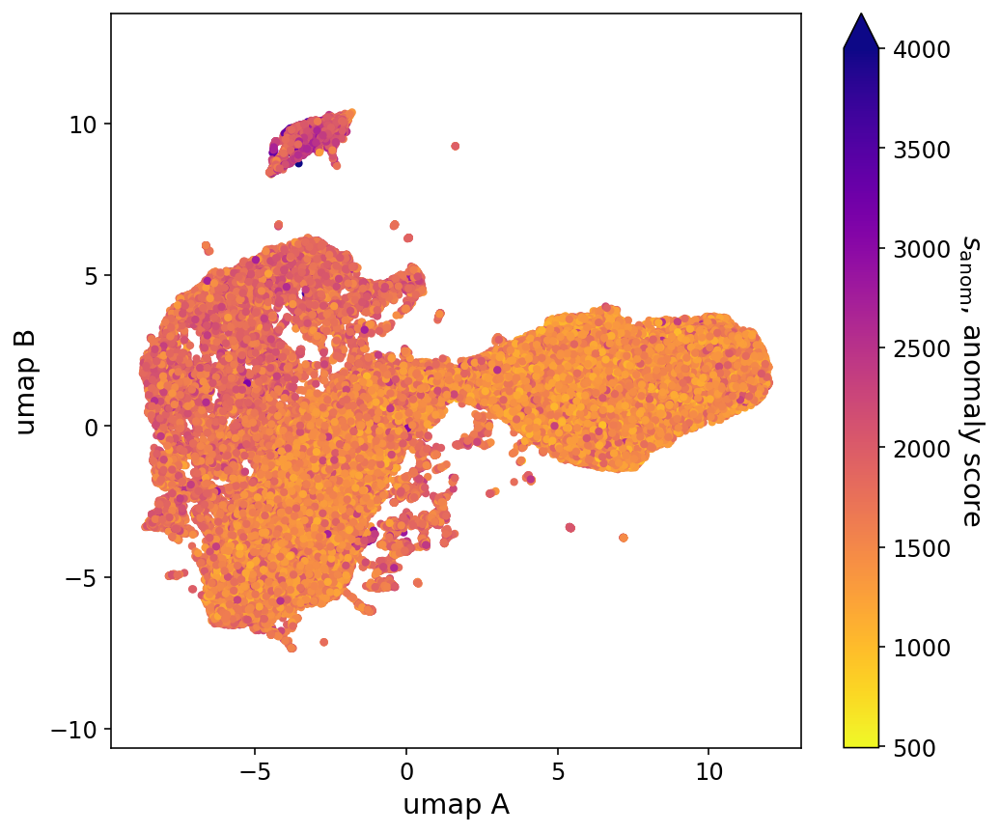

In [49]:
embedding = np.load(f"{embed_dir}/embedding_umap_reals_{taga}{umap_tag}.npy")
plot_umap(embedding, saveto=f'{plot_dir}/umap_{taga}_reals.png')

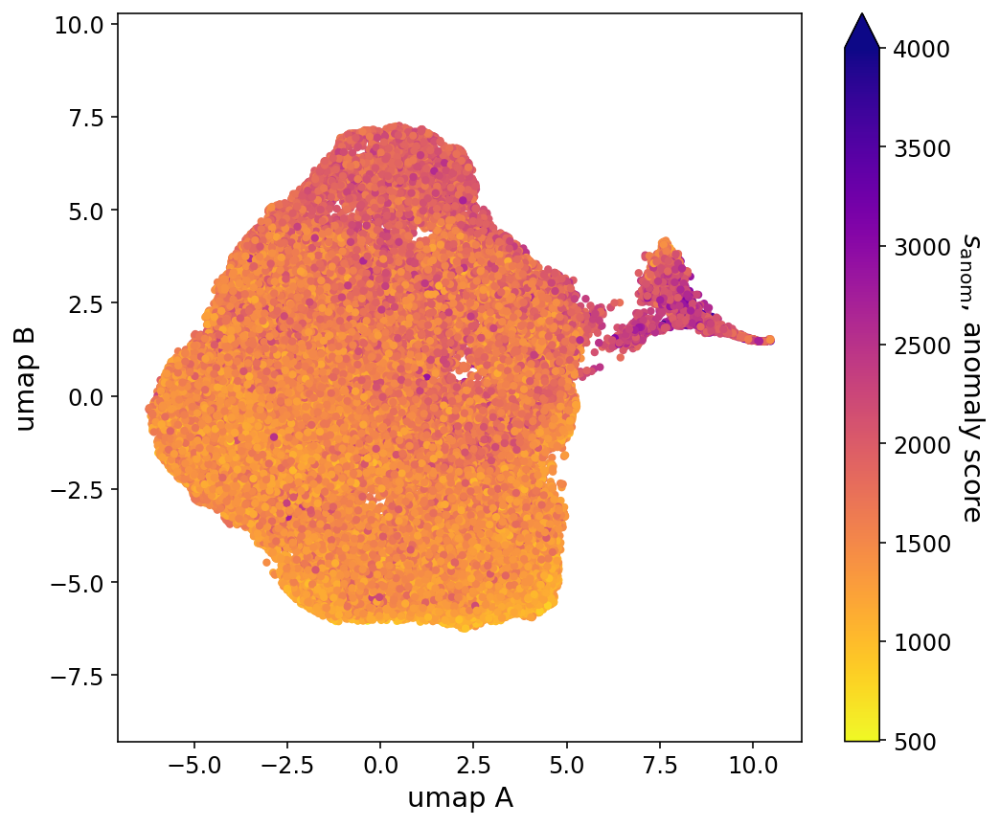

In [50]:
embedding = np.load(f"{embed_dir}/embedding_umap_auto_{taga}{auto_tag}_real{umap_tag}.npy", allow_pickle=True)
plot_umap(embedding, saveto=f'{plot_dir}/umap_{taga}_reals_auto.png')

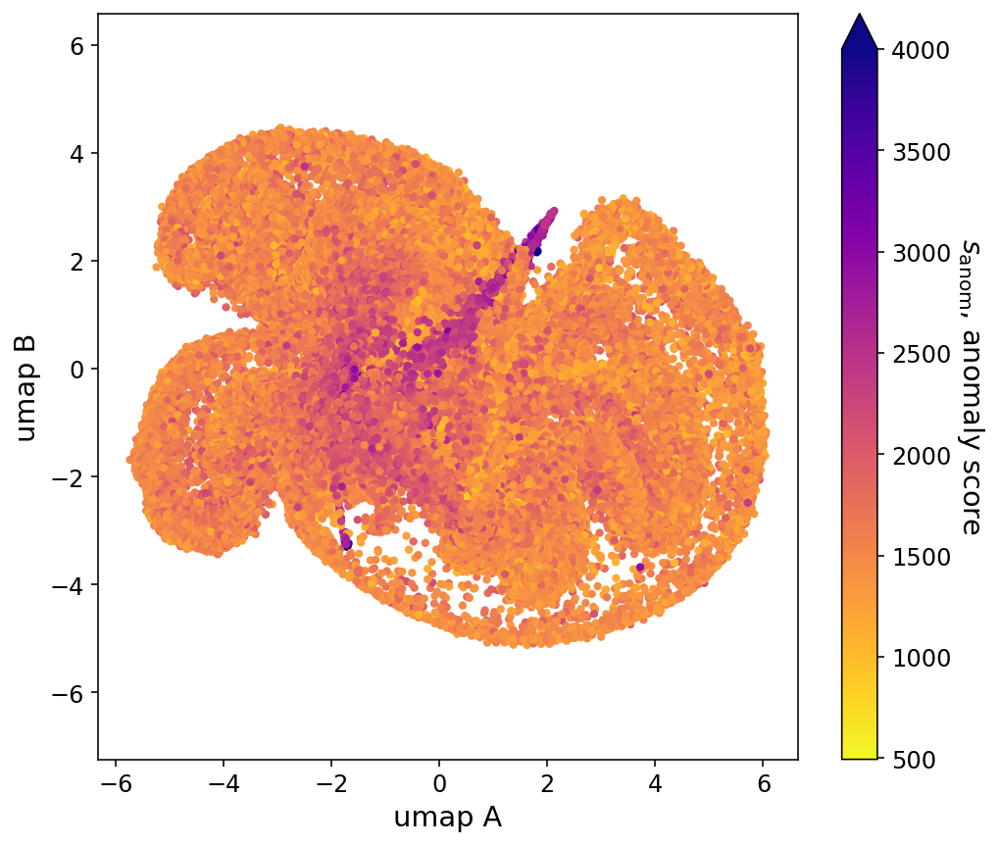

In [51]:
embedding = np.load(f"{embed_dir}/embedding_umap_residuals_{taga}{umap_tag}.npy")
plot_umap(embedding, saveto=f'{plot_dir}/umap_{taga}_resids.png')

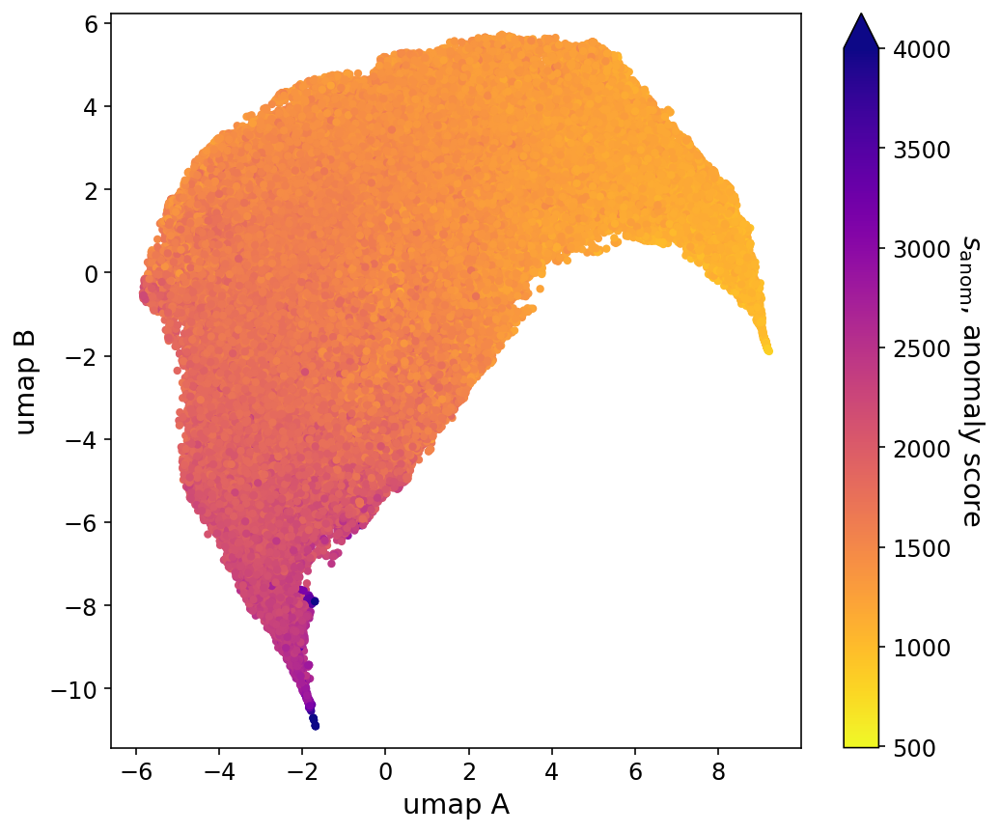

In [52]:
embedding = np.load(f"{embed_dir}/embedding_umap_auto_{taga}{auto_tag}{umap_tag}.npy", allow_pickle=True)
plot_umap(embedding, saveto=f'{plot_dir}/umap_{taga}_resids_auto.png')

# clusters of like interesting objects in 3sig umap (auto resid)

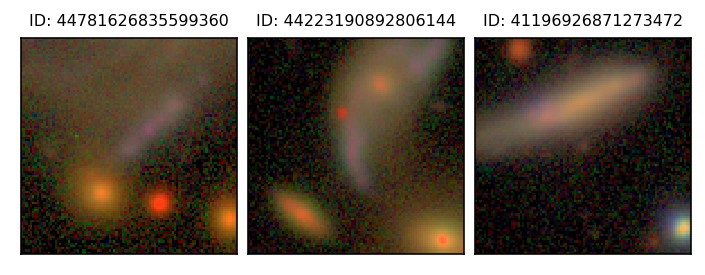

In [23]:
extended_purple = [105685, 80217, 539520]#, 378977, 43986, 355424]
saveto = f'{plot_dir}/cluster_extendedpurple.png'
plot_ims(extended_purple,1,3,saveto=saveto)#, saveto=f'{plot_dir}/anomalies_tidal_purple.png')

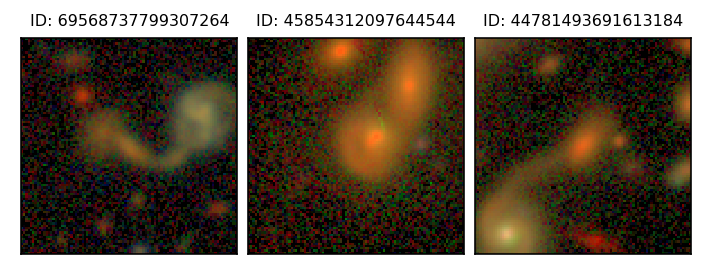

In [24]:
mergers_upper = [157767,147100,105162]
saveto = f'{plot_dir}/cluster_mergers.png'
plot_ims(mergers_upper,1,3,saveto=saveto)

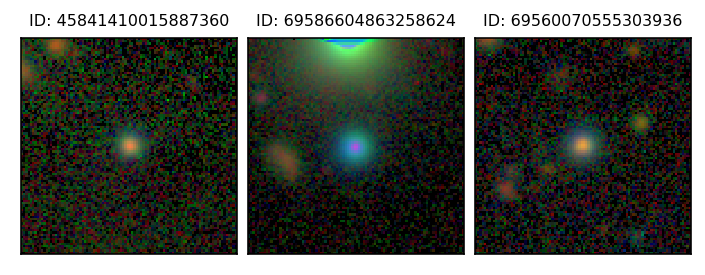

In [25]:
blue_dots_isolated = [137543,168508,153414]#,267827]
plot_ims(blue_dots_isolated,1,3)

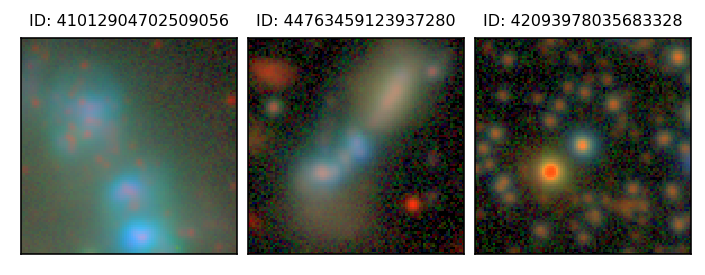

In [26]:
blue_sf = [461525, 86279,707620]#,782291]
saveto = f'{plot_dir}/cluster_bluesf.png'
plot_ims(blue_sf,1,3,saveto=saveto)

# Use stars on UMAP!

In [12]:
embed_dir = "/scratch/ksf293/kavli/anomaly/results/embeddings"
taga = 'gri_3sig'
umap_tag = '_nn5md0.1'
auto_tag = '_model29500_latent32'

In [13]:
import matplotlib.colors as colors
def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        'trunc({n},{a:.2f},{b:.2f})'.format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)))
    return new_cmap

cmap = plt.get_cmap('Purples')
cmap_purp = truncate_colormap(cmap, 0.25, 1.0)

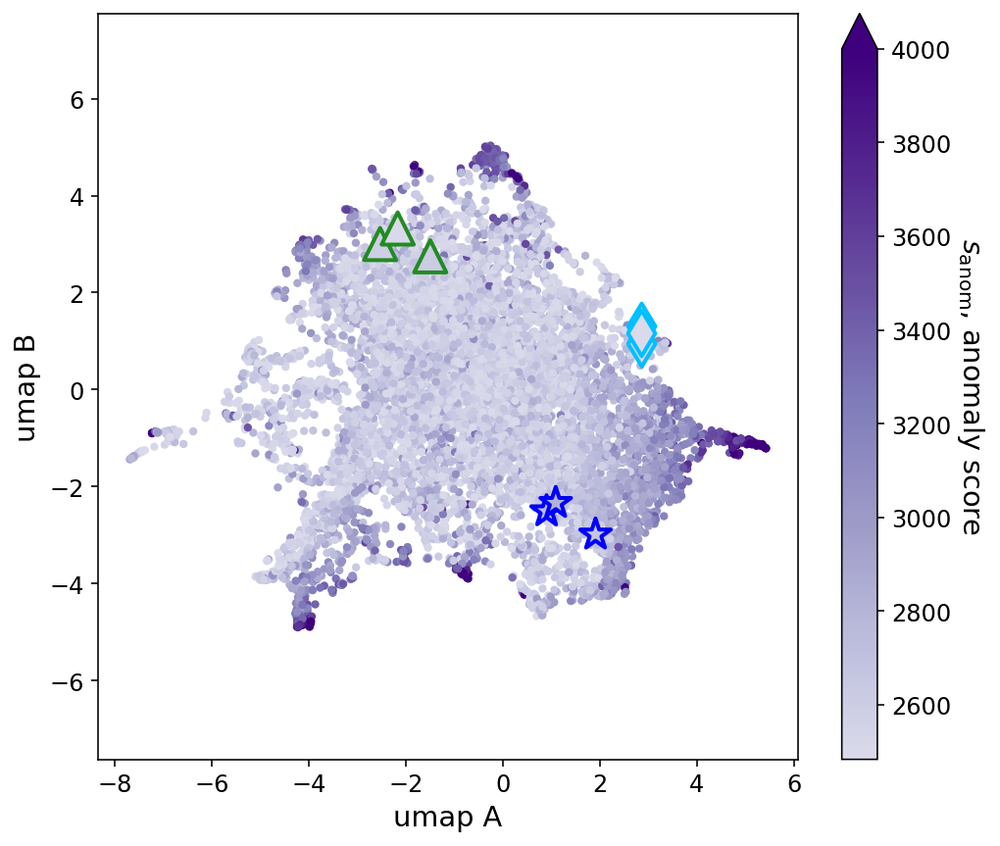

In [55]:
embedding = np.load(f"{embed_dir}/embedding_umap_auto_{taga}{auto_tag}{umap_tag}.npy", allow_pickle=True)
highlight_arrs = [mergers_upper, extended_purple, blue_sf]
highlight_colors = ['forestgreen', 'deepskyblue', 'blue']
highlight_markers = ['^', 'd', '*']
saveto = f'{plot_dir}/umap_3sig_resids_auto_highlight.png'
plot_umap(embedding, highlight_arrs=highlight_arrs, highlight_colors=highlight_colors, 
          highlight_markers=highlight_markers, saveto=saveto, cmap=cmap_purp)

## try boxes on UMAP

In [14]:
def get_idxs_in_box(embedding, umap_range, n_ims, seed=42):
    
    amin, amax, bmin, bmax = umap_range
    e1, e2, colorby, idxs = embedding
    idxs_in_box = [idxs[i] for i in range(len(e1)) if amin<e1[i]<amax and bmin<e2[i]<bmax]
    print(len(idxs_in_box))
    np.random.seed(seed=seed)
    idxs_subsample = np.random.choice(idxs_in_box, size=n_ims, replace=False)
    
    return idxs_subsample

In [15]:
embed_dir = "/scratch/ksf293/kavli/anomaly/results/embeddings"
taga = 'gri_3sig'
umap_tag = '_nn5md0.1'
auto_tag = '_model29500_latent32'
embedding_3sig = np.load(f"{embed_dir}/embedding_umap_auto_{taga}{auto_tag}{umap_tag}.npy", allow_pickle=True)

## test boxes

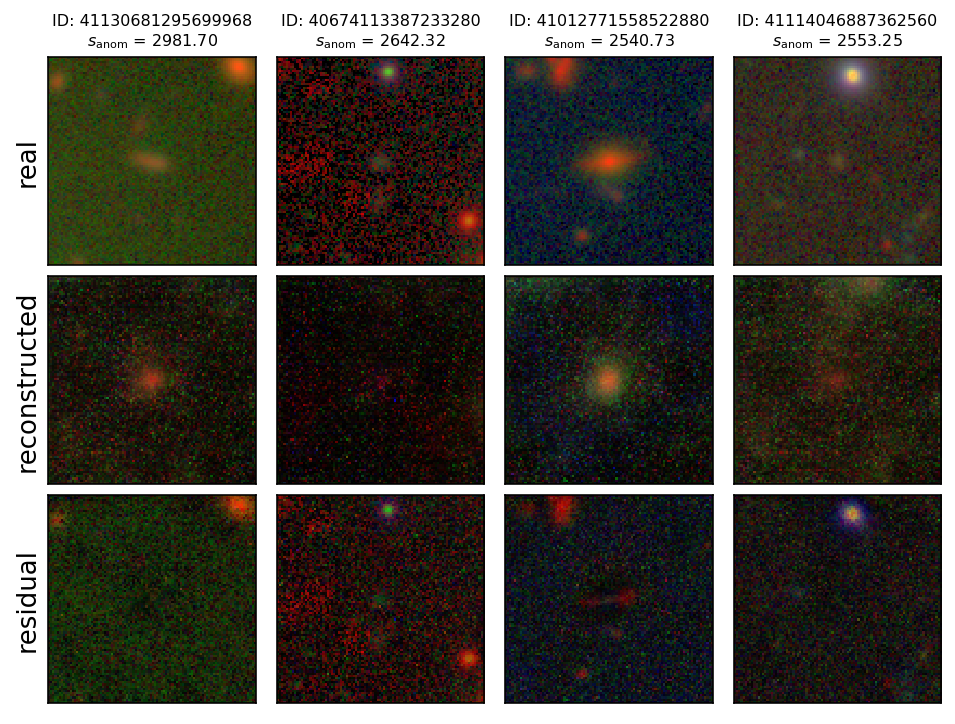

In [81]:
box_leftmid = [-6, -4, 0, 1]
n_ims = 4
idxs_box = get_idxs_in_box(embedding_3sig, box_leftmid, n_ims, seed=45)
plot_recons(idxs_box)

135


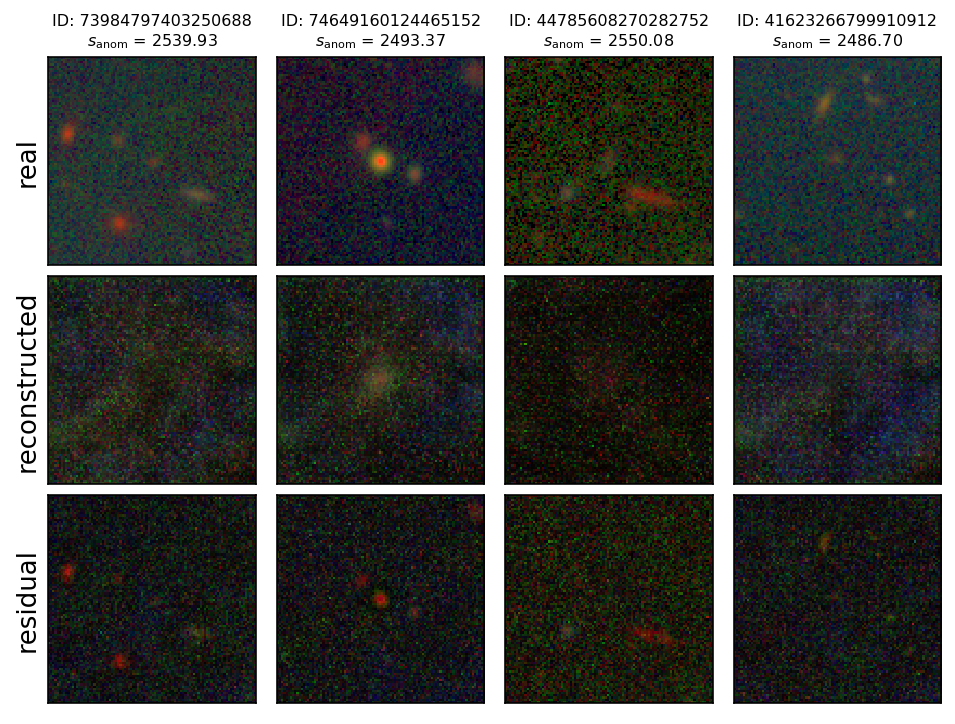

In [30]:
box_bluestar = [0.5, 1.5, -2.8, -2]
n_ims = 4
idxs_box = get_idxs_in_box(embedding_3sig, box_bluestar, n_ims, seed=46)
plot_recons(idxs_box)

78


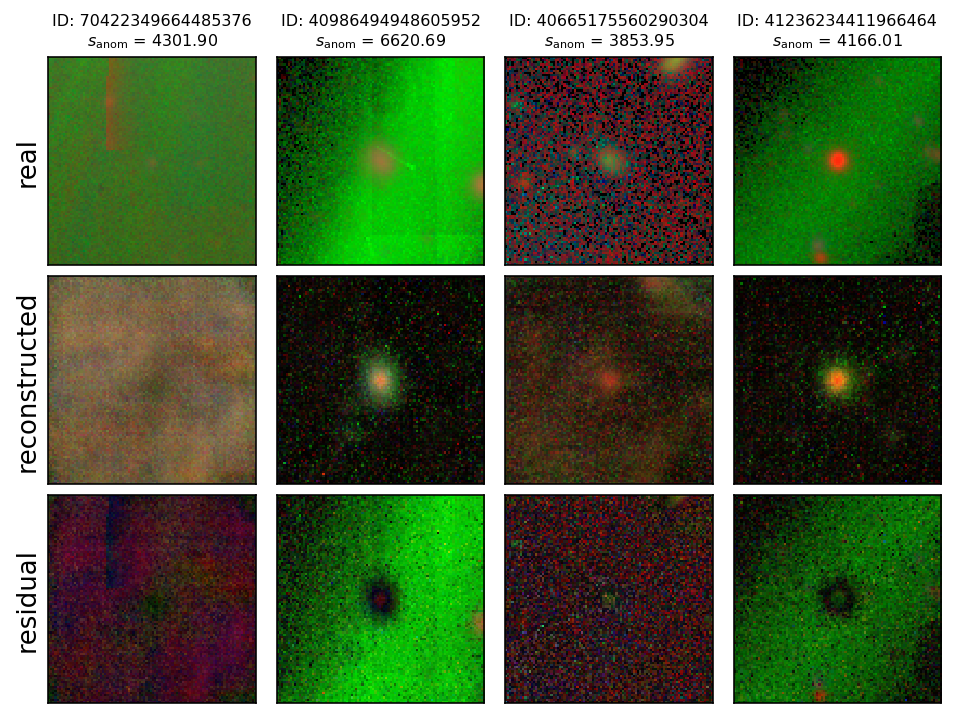

In [31]:
right = [4.5, 5.5, -1.5, -0.5]
n_ims = 4
idxs_box = get_idxs_in_box(embedding_3sig, right, n_ims, seed=40)
plot_recons(idxs_box)

168


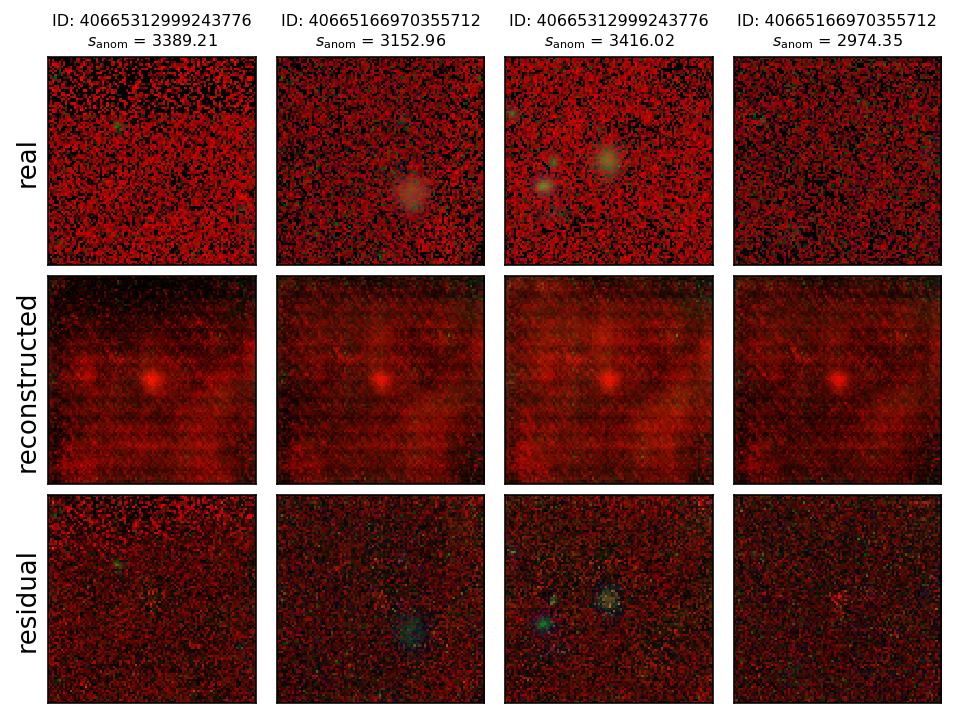

In [32]:
top = [-1, 1, 4, 6]
n_ims = 4
idxs_box = get_idxs_in_box(embedding_3sig, top, n_ims)
plot_recons(idxs_box)

## actual boxes chosen

130


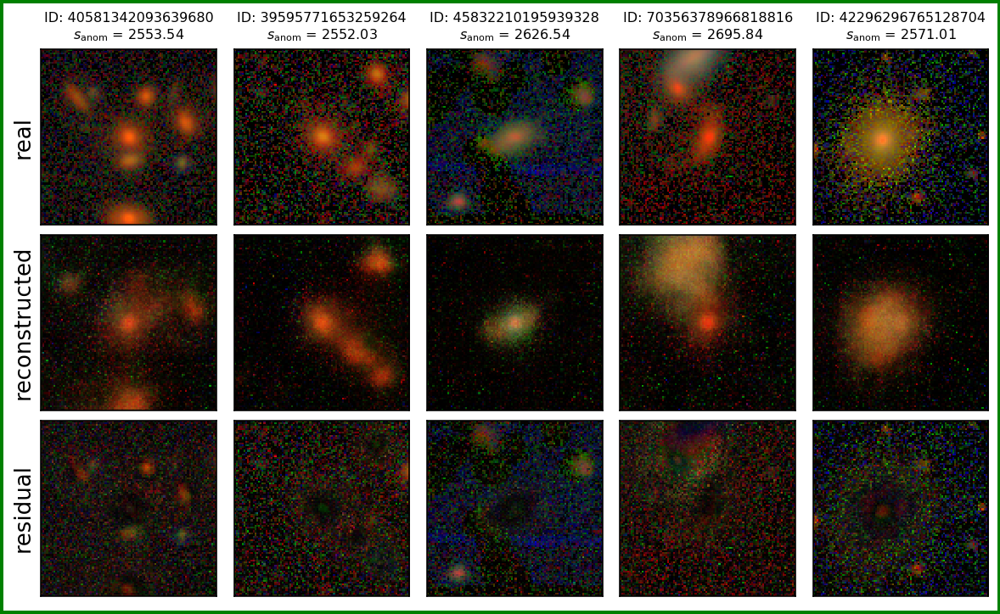

In [43]:
box_upper_left = [-3, -2, 2.5, 3.5]
bcolor_upper_left = 'green'
n_ims = 5
idxs_box = get_idxs_in_box(embedding_3sig, box_upper_left, n_ims, seed=42)
saveto = f'{plot_dir}/recons_box_{bcolor_upper_left}.png'
plot_recons(idxs_box, border_color=bcolor_upper_left, saveto=saveto)

In [69]:
# box_right = [2.5, 3.5, 0.5, 1.5]
# bcolor_right = 'magenta'
# n_ims = 5
# idxs_box = get_idxs_in_box(embedding_3sig, box_right, n_ims, seed=42) #44
# saveto = f'{plot_dir}/recons_box_{bcolor_right}.png'
# plot_recons(idxs_box, border_color=bcolor_right, saveto=saveto)

336


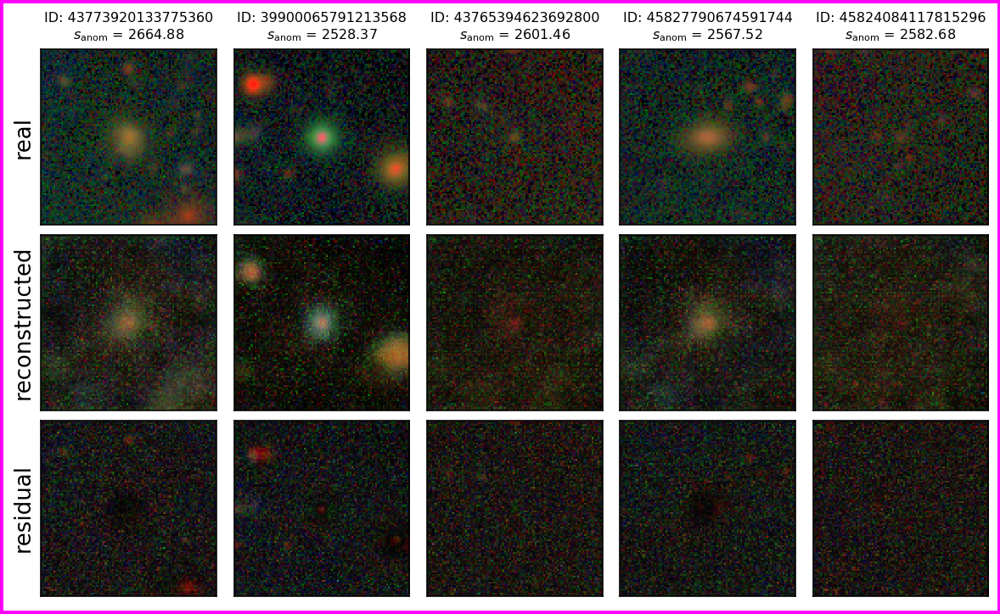

In [70]:
box_center = [-0.5, 0.5, -0.5, 0.5]
bcolor_center = 'magenta'
n_ims = 5
idxs_box = get_idxs_in_box(embedding_3sig, center, n_ims, seed=49) #44, 37, 49
saveto = f'{plot_dir}/recons_box_{bcolor_center}.png'
plot_recons(idxs_box, border_color=bcolor_center, saveto=saveto)

90


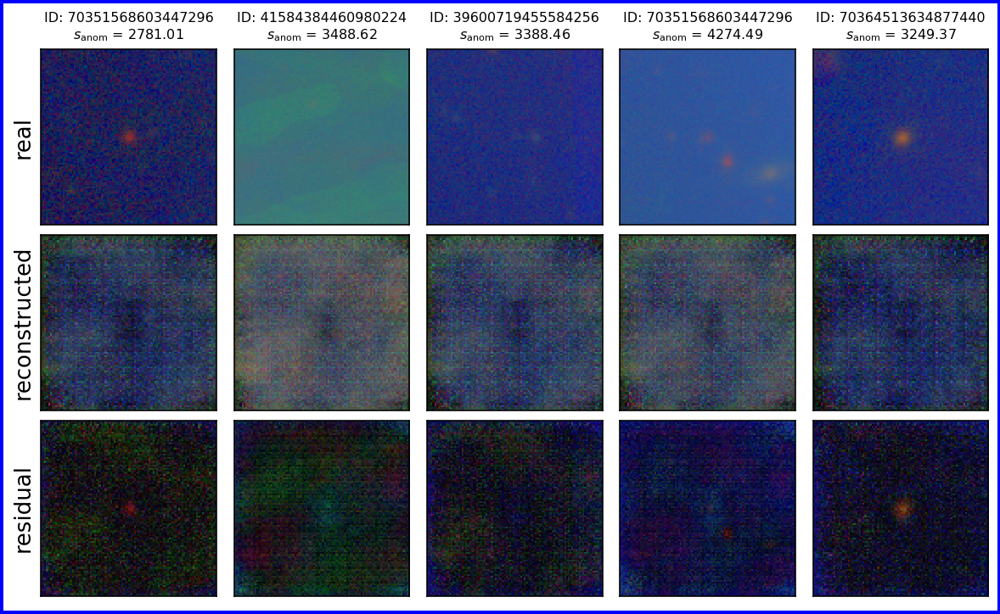

In [45]:
box_lower_left = [-4.5, -3.5, -5, -4]
bcolor_lower_left = 'blue'
n_ims = 5
idxs_box = get_idxs_in_box(embedding_3sig, box_lower_left, n_ims, seed=49)
saveto = f'{plot_dir}/recons_box_{bcolor_lower_left}.png'
plot_recons(idxs_box, border_color=bcolor_lower_left, saveto=saveto)

66


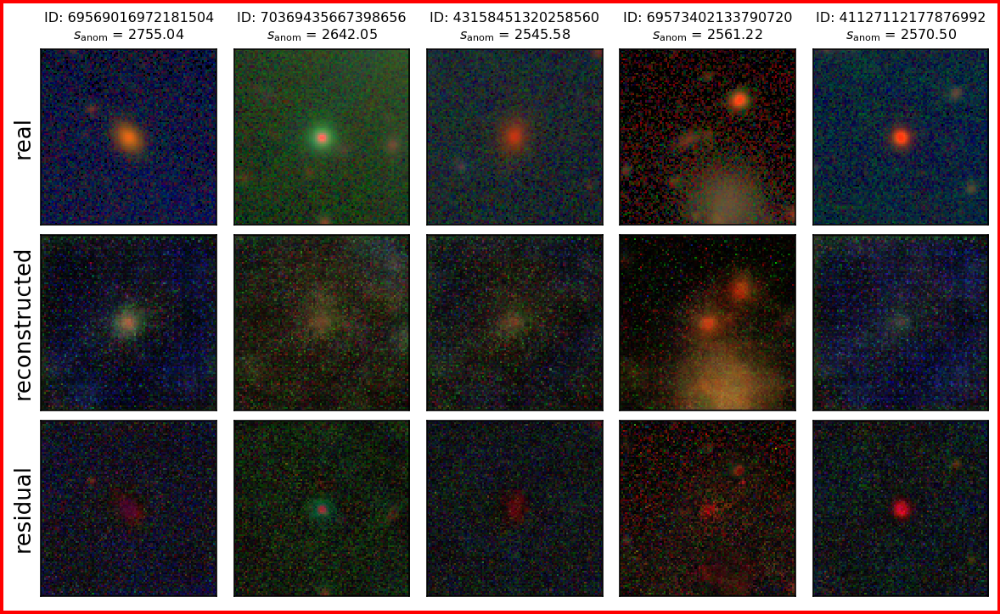

In [46]:
box_lower_right = [1, 2, -4, -3]
bcolor_lower_right = 'red'
n_ims = 5
idxs_box = get_idxs_in_box(embedding_3sig,  box_lower_right, n_ims, seed=49)
saveto = f'{plot_dir}/recons_box_{bcolor_lower_right}.png'
plot_recons(idxs_box, border_color=bcolor_lower_right, saveto=saveto)

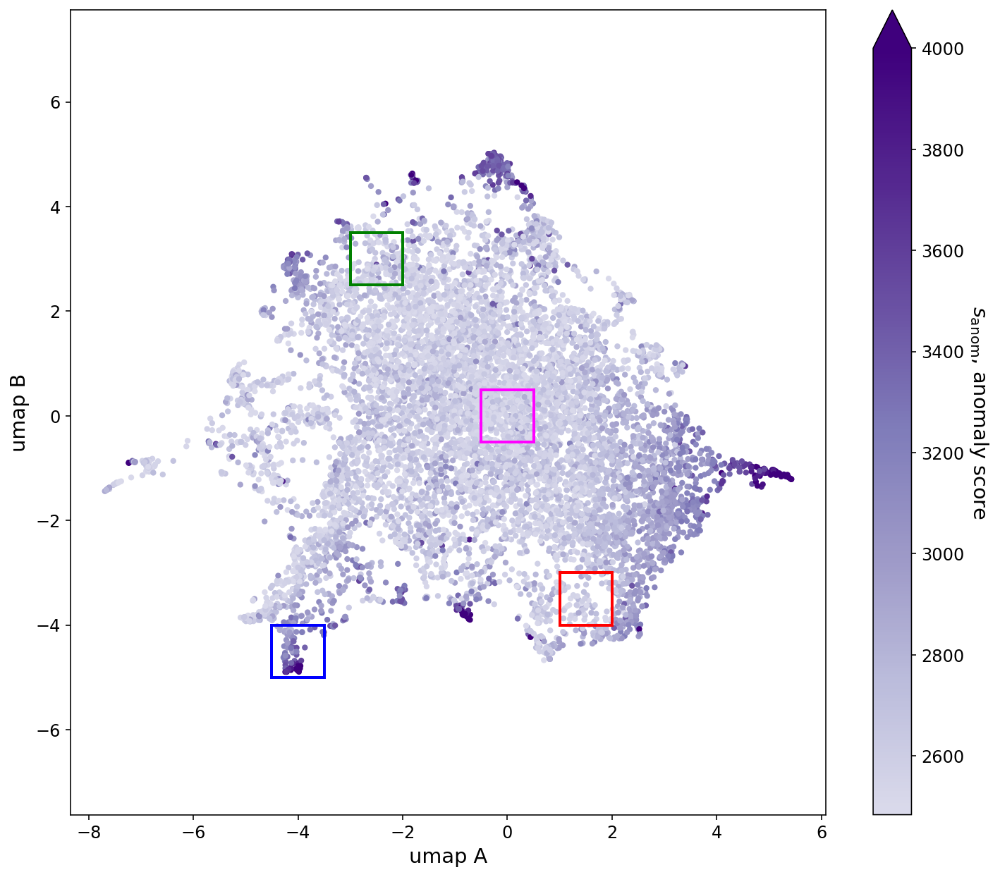

In [71]:
boxes = [box_center, box_upper_left, box_lower_left, box_lower_right]
box_colors = [bcolor_center, bcolor_upper_left, bcolor_lower_left, bcolor_lower_right]
saveto = f'{plot_dir}/umap_3sig_resids_auto_boxes.png'
plot_umap(embedding_3sig, boxes=boxes, box_colors=box_colors, cmap=cmap_purp, figsize=(12,10.5), saveto=saveto)

# blendedness extendedness

In [23]:
def plot_blend_extend(results_fn, cat_fn, cmap='plasma_r', saveto=None):
    print("Loading data")
    res = h5py.File(results_fn, 'r')
    scores = res['anomaly_scores']
    idxs = [int(idx) for idx in res['idxs'][:]]

    print("Loading catalog")
    cat = pd.read_csv(cat_fn)

    print("Getting blend & extend")
    extend = [cat['i_cmodel_ellipse_radius'].iloc[idx] for idx in idxs]
    extend = [np.log10(e) for e in extend]
    blend = [cat['i_blendedness_abs_flux'].iloc[idx] for idx in idxs]
    #set bad blends (those below 0) to 0
    blend = [b if b>=0 else 0 for b in blend]
    
    # if need to save intermediate result
    #result = np.array([extend, blend, scores, idxs])
    #np.save(save_fn, result)

    print("Plotting")
    plt.figure(figsize=(8,7))
    plt.scatter(extend, blend, marker='.', c=scores, cmap=cmap, s=8, alpha=0.1,
                                                           vmin=min(scores), vmax=4000)
    plt.xlabel('log(extendedness)')
    plt.ylabel('blendedness')

    cbar = plt.colorbar(extend='max')
    cbar.set_label(r'$s_\mathrm{anom}$, anomaly score', rotation=270, labelpad=18)
    
    if saveto:
        plt.savefig(saveto, bbox='tight')

In [10]:
def plot_hexbin(results_fn, cat_fn, xval, cmap='coolwarm', saveto=None):
    print("Loading data")
    res = h5py.File(results_fn, 'r')
    scores = res['anomaly_scores']
    idxs = [int(idx) for idx in res['idxs'][:]]

    print("Loading catalog")
    cat = pd.read_csv(cat_fn)

    print("Getting blend & extend")
    extend = [cat['i_cmodel_ellipse_radius'].iloc[idx] for idx in idxs]
    extend = [np.log10(e) for e in extend]
    blend = [cat['i_blendedness_abs_flux'].iloc[idx] for idx in idxs]
    #set bad blends (those below 0) to 0
    #extend = [e if e<=20 else 20 for e in extend]
    blend = [b if b>=0 else 0 for b in blend]
    scores = [s if s<=4000 else 4000 for s in scores]

    # if need to save intermediate result
    #result = np.array([extend, blend, scores, idxs])
    #np.save(save_fn, result)

    print("Plotting")
    plt.figure(figsize=(8,7))
    #plt.scatter(extend, scores, marker='.', c=blend, cmap=cmap, s=16, alpha=0.3)
    #plt.contourf(extend, scores, blend, cmap=cmap)
    
    plt.ylabel(r'$s_\mathrm{anom}$, anomaly score')
    
    if xval=='extendedness':
        xaxis = extend
        plt.xlabel(r'$R_\mathrm{eff}$, effective radius (arcsec)')
        plt
    if xval=='blendedness':
        xaxis = blend
        thresh = 10**(-0.375)
        plt.axvline(thresh, color='purple')
        plt.xlabel('blendedness')
    plt.hexbin(xaxis, scores, gridsize=30, cmap='Blues', bins='log')

    cbar = plt.colorbar()
    cbar.set_label('number in bin', rotation=270, labelpad=18)
    
    #mean and std vals
    mean = np.mean(scores)
    std = np.std(scores)
    lcolor='k'
    plt.axhline(mean, lw=1, color=lcolor)
    plt.axhline(mean+std, lw=0.8, color=lcolor, ls='--')
    plt.axhline(mean-std, lw=0.8, color=lcolor, ls='--')
    plt.axhline(mean+2*std, lw=0.6, color=lcolor, ls='--')
    plt.axhline(mean-2*std, lw=0.6, color=lcolor, ls='--')
    plt.axhline(mean+3*std, lw=0.4, color=lcolor, ls='--')
    plt.axhline(mean-3*std, lw=0.4, color=lcolor, ls='--')

    
    if saveto:
        plt.savefig(saveto, bbox='tight')

Loading data
Loading catalog
Getting blend & extend
Plotting


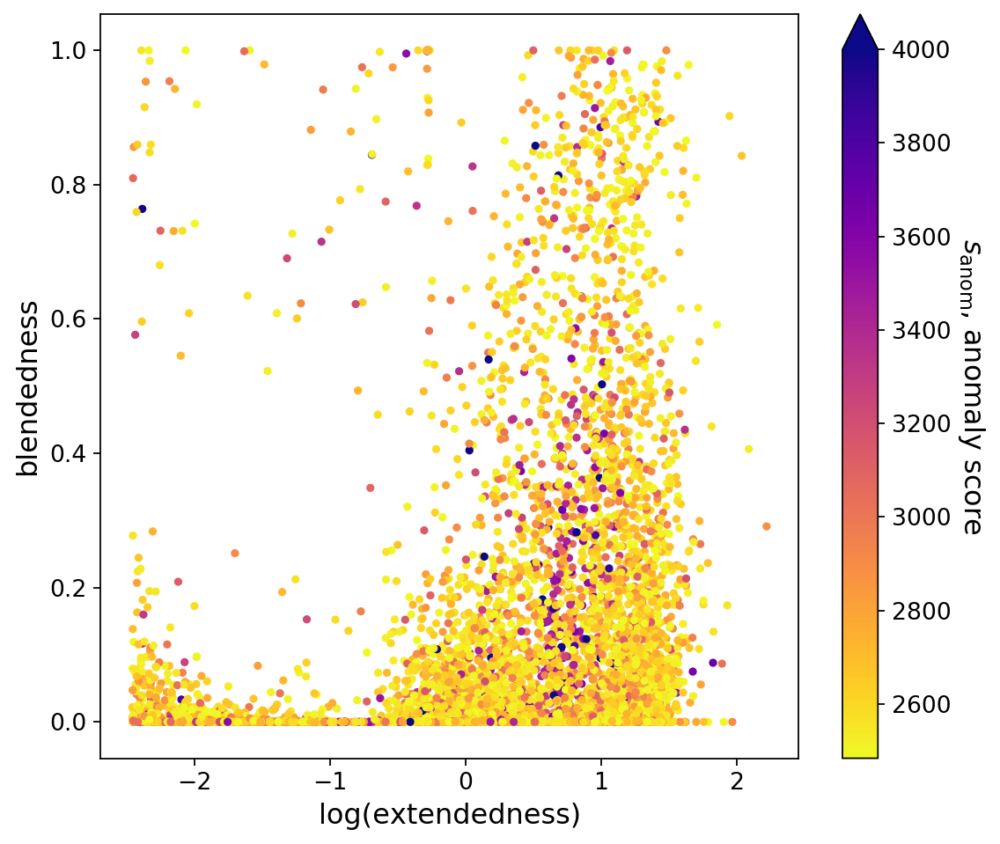

In [16]:
tag = 'gri_3sig'
base_dir = '..'

#savetag = f'_model{aenum}{aetag}'
savetag = ''

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/blendextend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_blend_extend(results_fn, cat_fn, saveto=saveto)

Loading data
Loading catalog
Getting blend & extend
Plotting


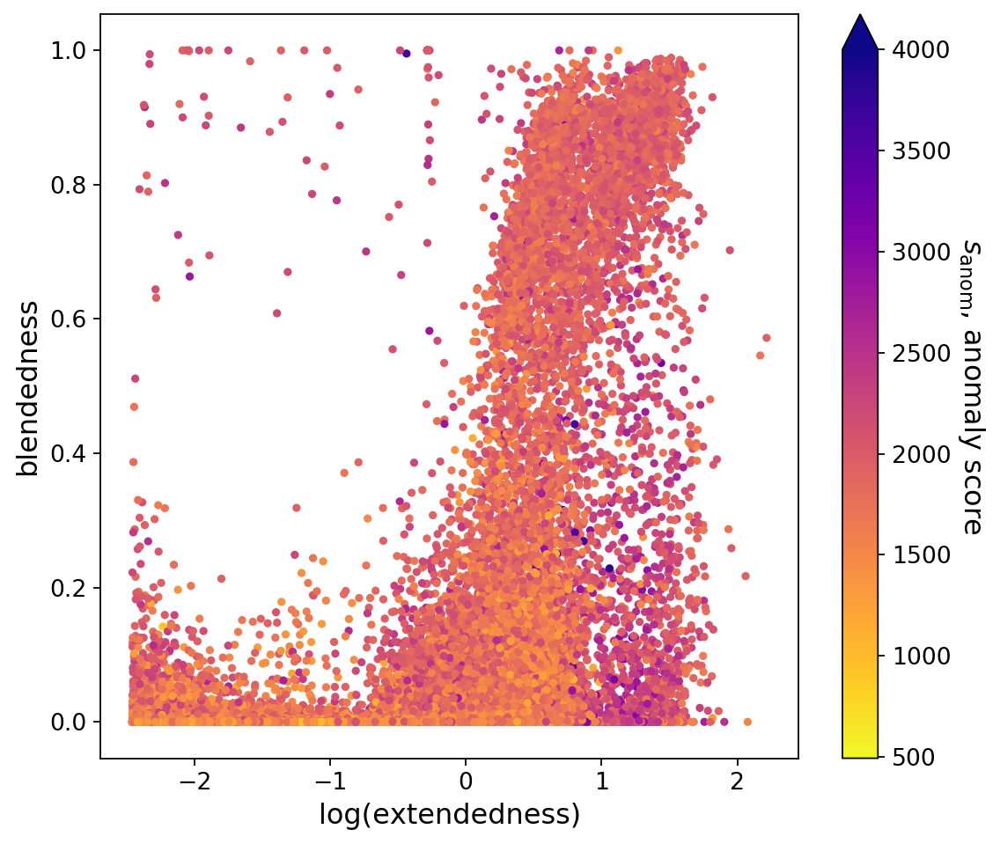

In [17]:
tag = 'gri_100k'
base_dir = '..'

#savetag = f'_model{aenum}{aetag}'
savetag = ''

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/blendextend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_blend_extend(results_fn, cat_fn, saveto=saveto)

Loading data
Loading catalog
Getting blend & extend
Plotting


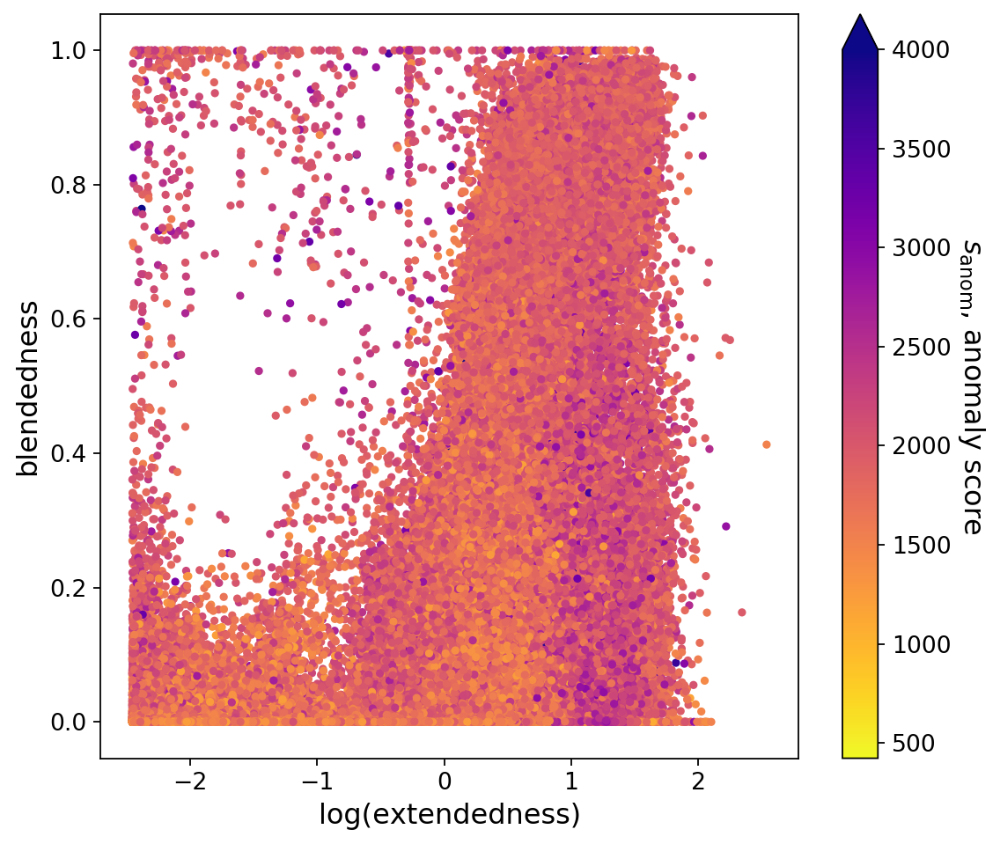

In [18]:
tag = 'gri'
base_dir = '..'

#savetag = f'_model{aenum}{aetag}'
savetag = ''

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/blendextend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_blend_extend(results_fn, cat_fn, saveto=saveto)

Loading data
Loading catalog
Getting blend & extend
Plotting


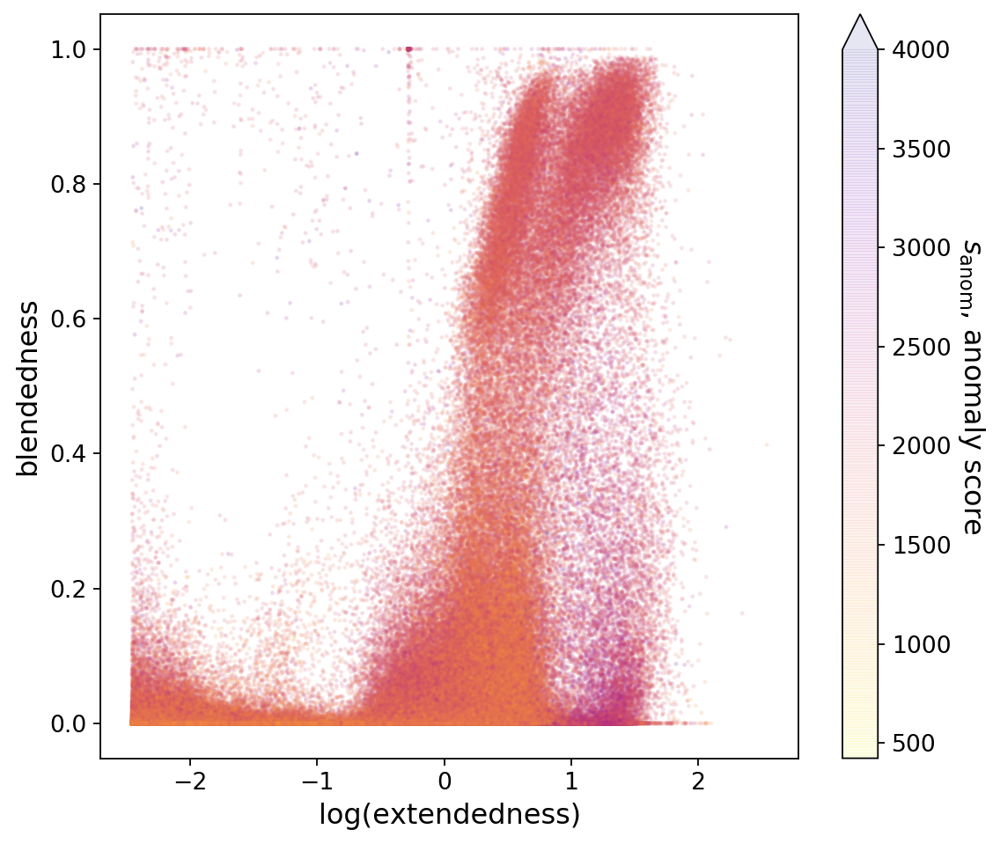

In [20]:
tag = 'gri'
base_dir = '..'

#savetag = f'_model{aenum}{aetag}'
savetag = '_alpha'

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/blendextend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_blend_extend(results_fn, cat_fn, saveto=saveto)

Loading data
Loading catalog
Getting blend & extend
Plotting


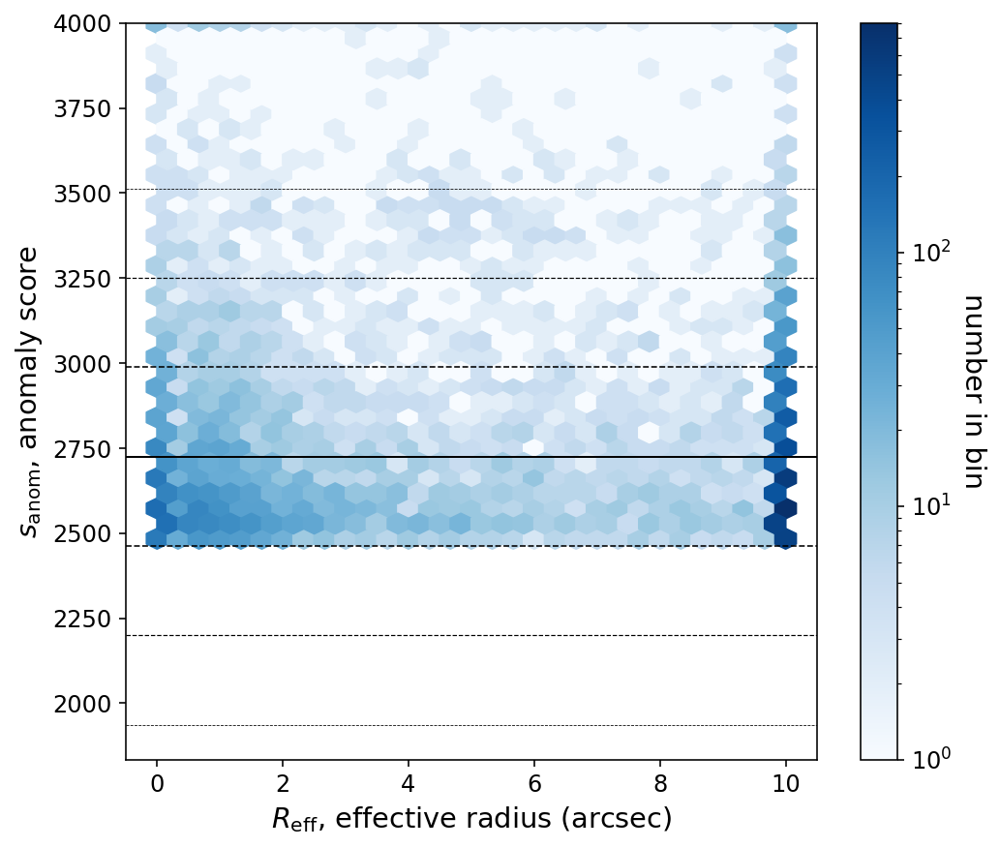

In [21]:
tag = 'gri_3sig'
base_dir = '..'

#savetag = f'_model{aenum}{aetag}'
savetag = ''

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/sanom-extend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_hexbin(results_fn, cat_fn, 'extendedness', saveto=saveto)

Loading data
Loading catalog
Getting blend & extend
Plotting


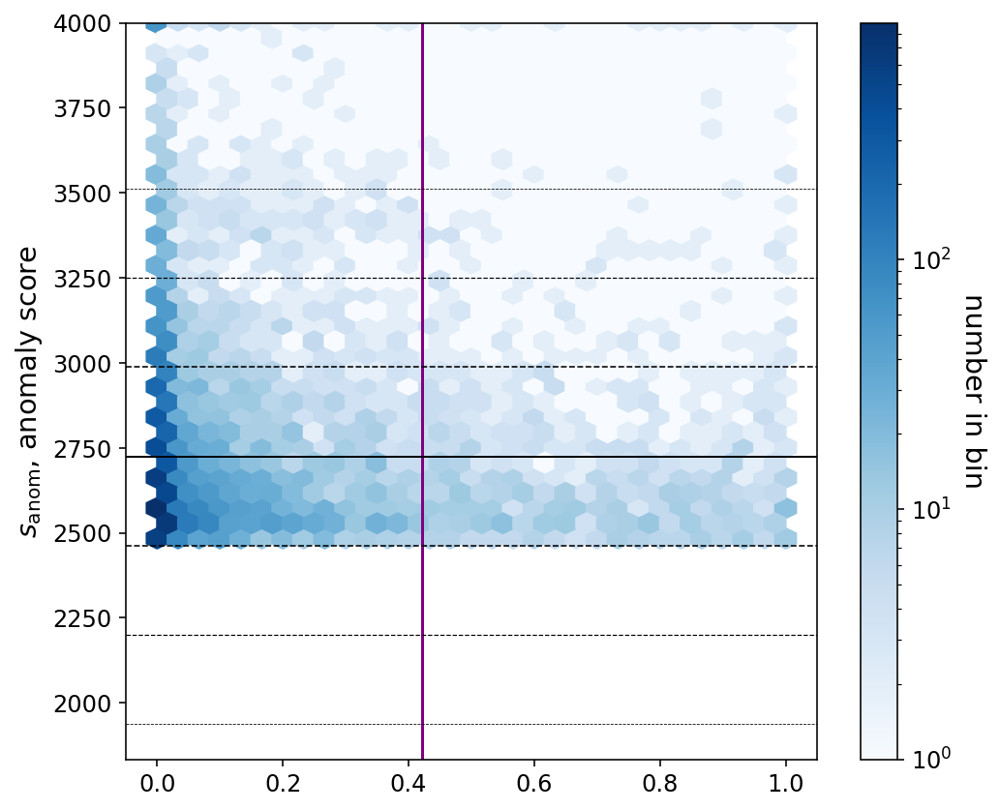

In [23]:
tag = 'gri_3sig'
base_dir = '..'

#savetag = f'_model{aenum}{aetag}'
savetag = ''

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/sanom-extend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_hexbin(results_fn, cat_fn, 'blendedness', saveto=saveto)

Loading data
Loading catalog
Getting blend & extend
Plotting


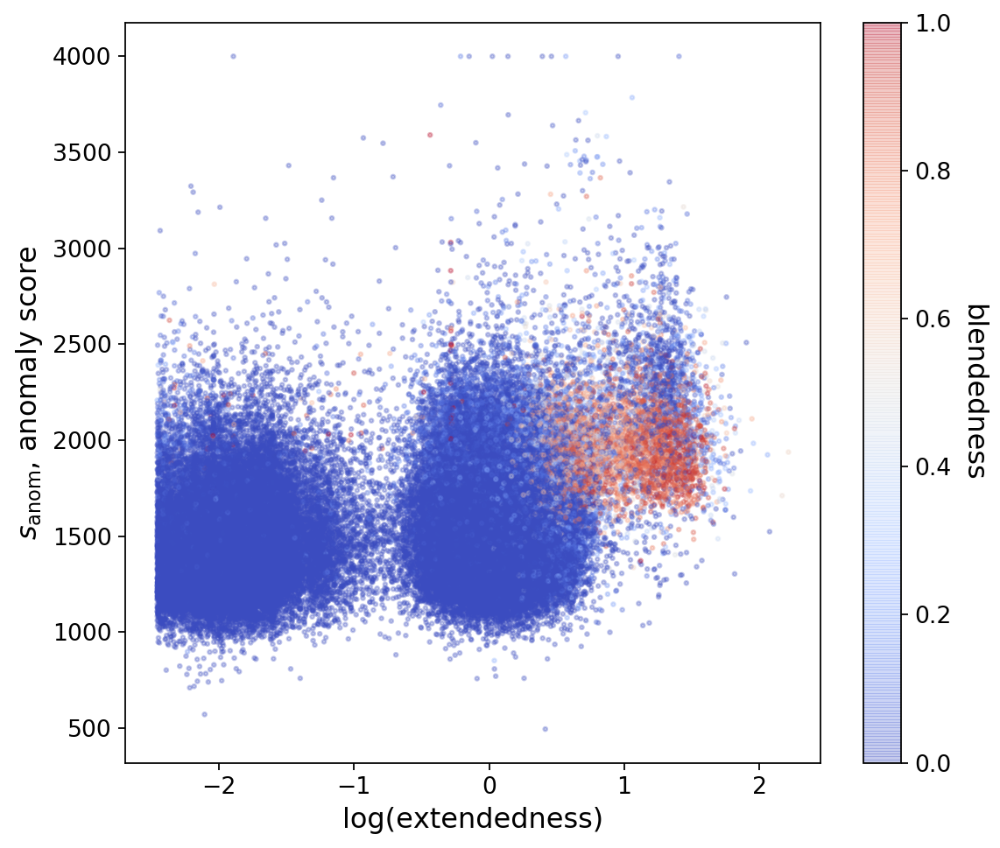

In [34]:
tag = 'gri_100k'
base_dir = '..'

#savetag = f'_model{aenum}{aetag}'
savetag = ''

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/sanom-extend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_sanom_extend(results_fn, cat_fn, saveto=saveto)

Loading data
Loading catalog
Getting blend & extend
Plotting


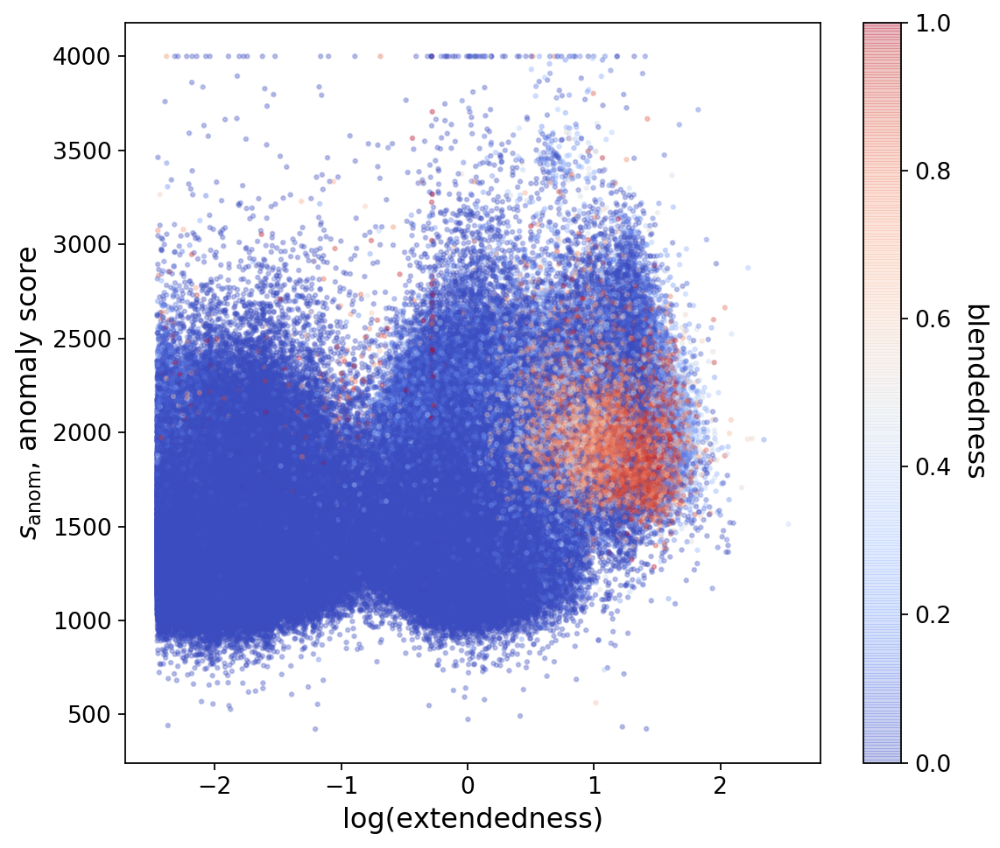

In [36]:
tag = 'gri'
base_dir = '..'

#savetag = f'_model{aenum}{aetag}'
savetag = ''

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/sanom-extend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_sanom_extend(results_fn, cat_fn, saveto=saveto)

Loading data
Loading catalog
Getting blend & extend
Plotting


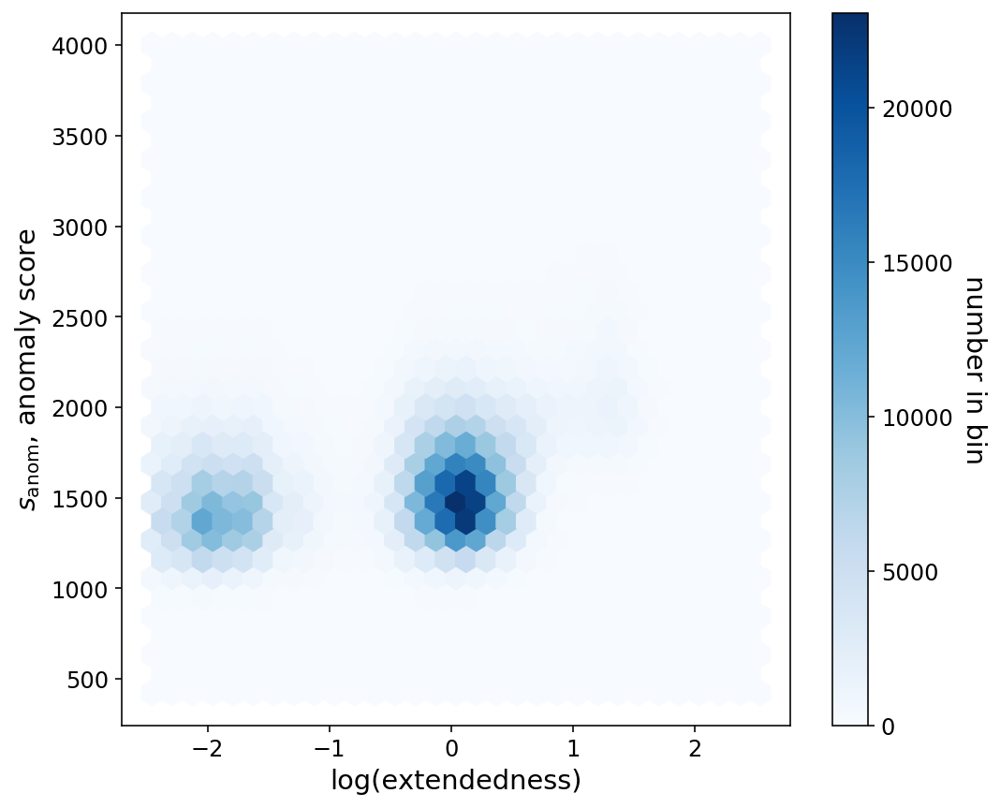

In [18]:
tag = 'gri'
base_dir = '..'

#savetag = f'_model{aenum}{aetag}'
savetag = '_hex'

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/sanom-extend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_sanom_extend(results_fn, cat_fn, saveto=saveto)

In [14]:
tag = 'gri'

#savetag = f'_model{aenum}{aetag}'
savetag = '_hexlog'

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'

#save_fn = f'{base_dir}/results/embeddings/embedding_blendextend_{tag}{savetag}.npy'
saveto = f'{plot_dir}/sanom-extend_{tag}{savetag}.png'

cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_hexbin(results_fn, cat_fn, 'extendedness', saveto=saveto)

Loading data


OSError: Unable to open file (unable to open file: name = '../results/results_gri.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

Loading data
Loading catalog
Getting blend & extend
Plotting


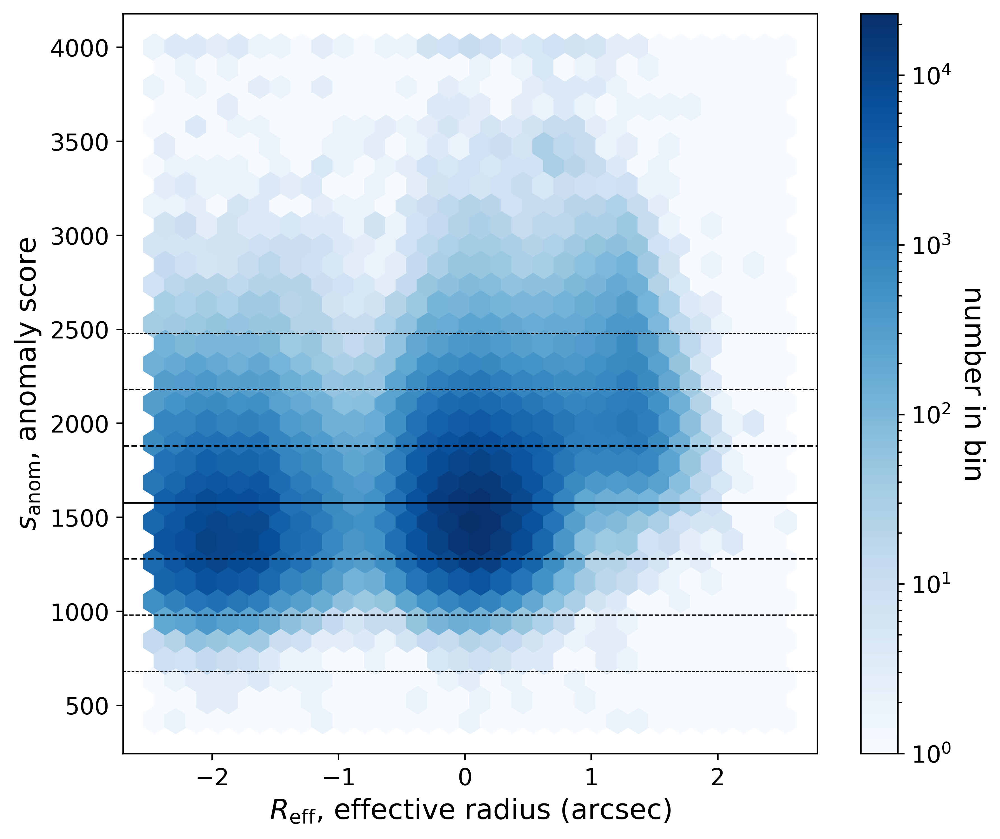

In [18]:
tag = 'gri'

savetag = '_hexlog'
saveto = f'{plot_dir}/sanom-reff_{tag}{savetag}.png'

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'
cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_hexbin(results_fn, cat_fn, 'extendedness', saveto=saveto)

Loading data
Loading catalog
Getting blend & extend
Plotting


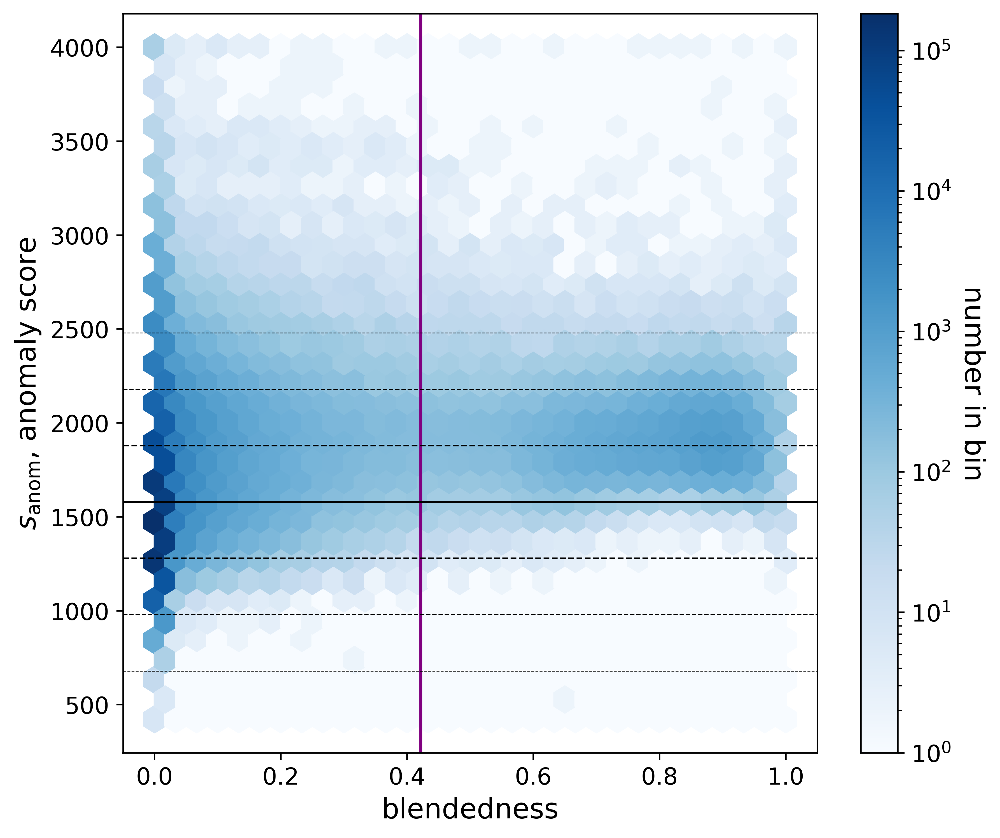

In [19]:
tag = 'gri'

savetag = '_hexlog'
saveto = f'{plot_dir}/sanom-blendedness_{tag}{savetag}.png'

results_dir = f'{base_dir}/results'
results_fn = f'{results_dir}/results_{tag}.h5'
cat_fn = f'{base_dir}/data/hsc_catalogs/pdr2_wide_icmod_20.0-20.5_clean_more.csv'

plot_hexbin(results_fn, cat_fn, 'blendedness', saveto=saveto)

# anomaly score distribution